In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%pylab inline
import numpy.lib.recfunctions as rfn
import illustris_python as il
import scipy.stats as st
from pandas import *
import pandas as pd
import warnings
from astropy.table import Table
warnings.filterwarnings('ignore')
little_h = 0.6774

dir_current = globals()['_dh'][0]
basePath = dir_current+'/../data/'
fileName = 'TNG100-1_99_galaxy_scale_len_height_5r.fits' 

cat = Table.read(basePath+fileName, format='fits')
data = cat.to_pandas()

Populating the interactive namespace from numpy and matplotlib


## Catalog Explore

In [2]:
%config InlineBackend.figure_format = 'retina'
plt.rc('font',size=16)

In [3]:
data.head()

,gal_id,f_disk_2d,f_disk_1d_2comp_1,f_disk_1d_2comp_2,f_disk_1d_2comp_counter,f_disk_1d_1comp,f_disk_1d_1comp_counter,chisq_1comp,chisq_2comp,bulge_r_1/2,bulge_r_1/2_err,bulge_index,bulge_index_err,disk_r_1/2,disk_r_1/2_err,mass
0,0.0,0.254996,2.961539e-01,1.441971e-02,0.109338,2.471397e-01,9.351949e-02,59.213467,55.797179,56.814302,3.211551,6.159505,0.600092,1000.000000,1000.000000,3.705585e+12
1,1.0,0.000000,1.631369e-14,1.631369e-15,0.003169,2.921106e-16,3.169137e-03,192.525198,192.525198,17.024719,0.646963,3.023050,0.168201,1000.000000,1000.000000,5.587917e+11
2,2.0,0.146807,1.552197e-01,7.865747e-05,0.080230,1.552988e-01,8.023012e-02,50.917631,50.917631,17.479631,1.133279,5.510873,0.623267,1000.000000,1000.000000,6.271396e+11
3,3.0,0.568697,2.055699e-01,3.471772e-01,0.038192,4.276057e-01,3.077587e-02,1344.788595,95.531291,4.861869,0.602889,3.156987,0.415410,8.184247,0.277411,1.715515e+11
4,4.0,0.189791,1.494139e-10,1.538097e-01,0.002356,1.414949e-01,1.621830e-44,176.055814,322.994629,9.897706,0.435469,4.281950,0.317183,1000.000000,1000.000000,1.333404e+11


In [4]:
data.describe()

,gal_id,f_disk_2d,f_disk_1d_2comp_1,f_disk_1d_2comp_2,f_disk_1d_2comp_counter,f_disk_1d_1comp,f_disk_1d_1comp_counter,chisq_1comp,chisq_2comp,bulge_r_1/2,bulge_r_1/2_err,bulge_index,bulge_index_err,disk_r_1/2,disk_r_1/2_err,mass
count,20144.000000,20144.000000,20144.000000,20144.000000,2.014400e+04,20144.000000,2.014400e+04,20144.000000,20144.000000,20144.000000,2.014400e+04,20144.000000,20144.000000,2.014400e+04,2.014400e+04,2.014400e+04
mean,426818.931593,0.536695,0.300102,0.228346,1.710643e-02,0.481231,1.698076e-02,337.432458,100.891730,39.546050,1.489962e+04,6.684775,87.333827,-1.057033e+06,inf,2.069511e+10
std,196019.930085,0.213996,0.167441,0.181396,3.232847e-02,0.187598,4.322677e-02,507.894617,211.032449,2012.419917,1.080871e+06,15.603622,791.671702,4.956756e+06,NaN,7.585698e+10
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,-1.070215e+08,0.000000e+00,1.071815e+09
25%,276224.750000,0.375511,0.168607,0.042777,1.690593e-34,0.338628,3.935048e-22,60.915302,46.863712,1.222324,2.024391e-01,1.821469,0.301784,1.766745e+00,6.429936e-02,2.238934e+09
50%,488925.500000,0.563165,0.282341,0.218950,1.317874e-14,0.495363,1.442928e-12,116.325820,60.506538,1.727881,3.328969e-01,2.533477,0.529784,2.657298e+00,1.178209e-01,4.665027e+09
75%,593405.250000,0.709176,0.413140,0.382298,2.227869e-02,0.630536,1.195093e-02,352.920079,95.262255,2.266932,5.309925e-01,4.007999,1.182122,5.123370e+00,4.519765e-01,1.482525e+10
max,934962.000000,0.974464,0.905503,0.715598,3.798884e-01,0.932986,6.185569e-01,11375.959759,11375.925468,263652.069036,1.472221e+08,100.000000,48561.973630,1.000000e+03,inf,3.705585e+12


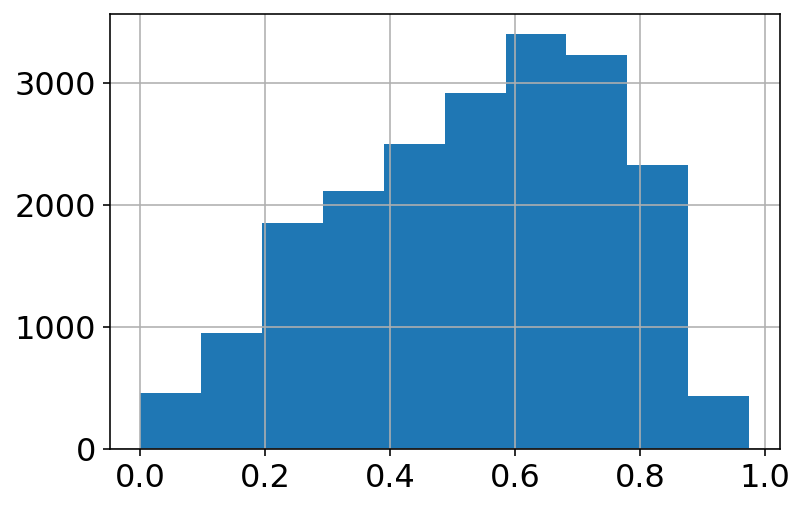

In [5]:
data['f_disk_2d'].hist()

In [6]:
fdisk_bins = np.linspace(0,1, 11)
fdisk_bins

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])

In [7]:
data_cut = pd.cut(data.f_disk_2d, fdisk_bins)
grp = data.groupby(by=data_cut)
grp.mean()

,gal_id,f_disk_2d,f_disk_1d_2comp_1,f_disk_1d_2comp_2,f_disk_1d_2comp_counter,f_disk_1d_1comp,f_disk_1d_1comp_counter,chisq_1comp,chisq_2comp,bulge_r_1/2,bulge_r_1/2_err,bulge_index,bulge_index_err,disk_r_1/2,disk_r_1/2_err,mass
f_disk_2d,,,,,,,,,,,,,,,,
"(0.0, 0.1]",364616.942643,0.061175,0.051888,0.011081,0.019087,0.070530,0.038405,263.088991,268.769290,9.432400,1.286104e+02,5.754824,21.077591,1.000000e+03,1000.0,4.603770e+10
"(0.1, 0.2]",383917.233038,0.155941,0.129768,0.033853,0.044518,0.170603,0.067819,101.378092,103.345803,44.957274,8.673911e+02,6.386699,26.766730,1.000000e+03,1000.0,5.175007e+10
"(0.2, 0.3]",406847.146708,0.252252,0.196054,0.065964,0.036038,0.247179,0.043698,95.201676,87.244402,2.756455,4.671765e+00,5.626491,25.298128,1.000000e+03,1000.0,2.653349e+10
"(0.3, 0.4]",415149.436025,0.352025,0.250708,0.102498,0.030934,0.325228,0.032054,106.895414,80.930518,12.592565,1.704986e+03,6.799879,82.636975,-1.685556e+06,NaN,1.740478e+10
"(0.4, 0.5]",431015.041841,0.452072,0.280285,0.163239,0.023636,0.404257,0.020139,116.310309,71.542746,19.904641,3.904893e+02,6.152328,44.408947,-1.147523e+06,NaN,1.460772e+10
"(0.5, 0.6]",439407.670760,0.551593,0.304661,0.230121,0.015125,0.487253,0.010240,175.226855,81.998375,23.963425,9.266812e+02,5.325802,41.211270,-1.040381e+06,NaN,1.383837e+10
"(0.6, 0.7]",443888.627473,0.650662,0.335110,0.295873,0.008610,0.575079,0.004146,289.866573,99.755189,6.434665,6.463689e+02,5.603325,50.059540,-9.388996e+05,NaN,1.493843e+10
"(0.7, 0.8]",437815.491854,0.747859,0.367066,0.364452,0.003907,0.661466,0.000865,564.567833,121.356606,10.459283,7.032230e+03,7.597494,125.481464,-1.309696e+06,NaN,1.979675e+10
"(0.8, 0.9]",427171.483936,0.841749,0.431735,0.408006,0.001443,0.747132,0.000131,1111.936059,119.003721,71.127397,2.881895e+04,10.354317,285.342845,-1.665997e+06,NaN,2.575254e+10


In [8]:
df_bin=grp["f_disk_2d","mass"].agg(["mean","std","count"])
df_bin

f_disk_2d                          mass                    
                mean       std count          mean           std count
f_disk_2d                                                             
(0.0, 0.1]  0.061175  0.027083   401  4.603770e+10  1.420475e+11   401
(0.1, 0.2]  0.155941  0.028118  1017  5.175007e+10  1.954918e+11  1017
(0.2, 0.3]  0.252252  0.027554  1929  2.653349e+10  1.323789e+11  1929
(0.3, 0.4]  0.352025  0.028972  2204  1.740478e+10  6.392240e+10  2204
(0.4, 0.5]  0.452072  0.029177  2629  1.460772e+10  6.005261e+10  2629
(0.5, 0.6]  0.551593  0.028650  3013  1.383837e+10  4.324139e+10  3013
(0.6, 0.7]  0.650662  0.027792  3487  1.493843e+10  3.183762e+10  3487
(0.7, 0.8]  0.747859  0.028870  3253  1.979675e+10  3.221710e+10  3253
(0.8, 0.9]  0.841749  0.027544  1992  2.575254e+10  2.657604e+10  1992
(0.9, 1.0]  0.917820  0.016180   149  3.154581e+10  2.351573e+10   149

In [9]:
x_avg=list(df_bin['f_disk_2d']['mean'])
y_avg=list(df_bin['mass']['mean'])
y_std=list((df_bin['mass']['std']))
y_err=list((df_bin['mass']['std'])/np.sqrt(df_bin['mass']['count']))

Text(0.5, 0, 'fdisk_2D')

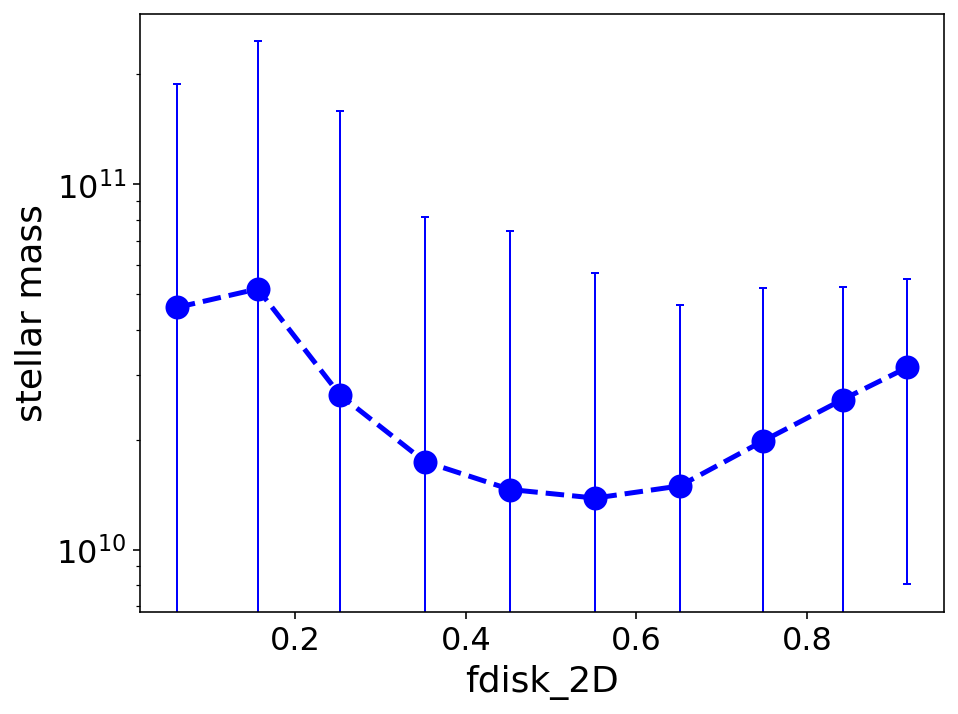

In [10]:
fig, ax = plt.subplots(figsize=(7.2, 5.5))

ax.errorbar(x_avg,y_avg,yerr=y_std,color='b',capsize=2,capthick=1, elinewidth=1,linewidth=2.5,fmt="o--",markeredgecolor='none',markersize=12)

ax.set_yscale('log')
ax.set_ylabel('stellar mass',fontsize=18)
ax.set_xlabel('fdisk_2D',fontsize=18)

In [11]:
# rank galaxies with mass > 1e10 by their f_disk_2d values.
threshold_mass = 1e10
data[ data['mass']>threshold_mass ].sort_values(by=['f_disk_2d'], ascending=False)[['gal_id', 'f_disk_2d','mass']][0:10]

,gal_id,f_disk_2d,mass
5936,322162.0,0.942437,2.742913e+10
10272,495214.0,0.940321,3.767052e+10
12846,556668.0,0.937655,2.261175e+10
10753,509468.0,0.937429,4.950812e+10
7432,388820.0,0.937206,2.720105e+10
7307,383508.0,0.935810,3.864432e+10
8190,421835.0,0.935765,7.455241e+10
10078,489054.0,0.934498,3.877748e+10
10591,504837.0,0.934397,4.628448e+10
10839,511858.0,0.933706,4.519724e+10


## ------ Connect to TNGcube tools ------

In [12]:
import sys
import os

dir_current = globals()['_dh'][0]
dir_TNGcube = dir_current+'/../../TNGcube/'
print('directory to TNGcube:', dir_TNGcube)

sys.path.append(dir_TNGcube)
from queryTNG import *

directory to TNGcube: /Users/hhg/Research/kinematic_lensing/repo/gal_decomp_paper/HH_notebooks/../../TNGcube/


In [13]:
baseURL

'http://www.tng-project.org/api/'

In [14]:
snapNum = get_snapNum(redshift=0., simName='TNG100-1', baseURL=baseURL)
snapNum

99

### QueryTNG

In [15]:
QTNG = QueryTNG(simName='TNG100-1', snapNum=99)

In [16]:
QTNG.simInfo

{'name': 'TNG100-1',
 'description': 'Main high-resolution IllustrisTNG100 run including the full TNG physics model.',
 'name_alt': 'L75n1820TNG',
 'boxsize': 75000.0,
 'z_start': 127.0,
 'z_final': 0.0,
 'cosmology': 'Planck2015',
 'omega_0': 0.3089,
 'omega_L': 0.6911,
 'omega_B': 0.0486,
 'hubble': 0.6774,
 'physics_model': 'Fiducial TNG Model',
 'has_cooling': True,
 'has_starformation': True,
 'has_winds': True,
 'has_blackholes': True,
 'mass_gas': 9.43946e-05,
 'mass_dm': 0.000505574296436975,
 'softening_dm_comoving': 1.0,
 'softening_stars_comoving': 1.0,
 'softening_blackholes_comoving': 1.0,
 'softening_gas_comoving': 1.0,
 'softening_dm_max_phys': 0.5,
 'softening_stars_max_phys': 0.5,
 'softening_blackholes_max_phys': 1.0,
 'softening_gas_max_phys': 0.5,
 'softening_gas_factor': 2.5,
 'softening_gas_comoving_min': 0.125,
 'num_dm': 6028568000,
 'num_tr_mc': 0,
 'num_tr_vel': 0,
 'longids': True,
 'is_uniform': True,
 'is_zoom': False,
 'is_subbox': False,
 'num_files_snaps

In [17]:
QTNG.snapInfo

{'simulation': 'http://www.tng-project.org/api/TNG100-1/',
 'number': 99,
 'redshift': 2.22044604925031e-16,
 'num_gas': 5453610043,
 'num_dm': 6028568000,
 'num_trmc': 12057136000,
 'num_stars': 453723346,
 'num_bhs': 37053,
 'num_groups_fof': 6291349,
 'num_groups_subfind': 4371211,
 'num_groups_rockstar': 0,
 'filesize_snapshot': 1852107755772.0,
 'filesize_groupcat': 4446214808.0,
 'filesize_rockstar': 0.0,
 'url': 'http://www.tng-project.org/api/TNG100-1/snapshots/99/',
 'subhalos': 'http://www.tng-project.org/api/TNG100-1/snapshots/99/subhalos/',
 'vis': {'groupcat_sfms': 'http://www.tng-project.org/api/TNG100-1/snapshots/99/subhalos/plot.png?xQuant=mstar2_log&yQuant=ssfr&xlim=9.0%2C11.0',
  'groupcat_sizemass': 'http://www.tng-project.org/api/TNG100-1/snapshots/99/subhalos/plot.png?xQuant=mstar2_log&yQuant=size_stars',
  'groupcat_mz_gas': 'http://www.tng-project.org/api/TNG100-1/snapshots/99/subhalos/plot.png?xQuant=mstar2_log&yQuant=Z_gas',
  'groupcat_mz_stars': 'http://www.t

### QTNG.query_subhaloInfo(subhaloID)

In [18]:
# fail with TNGmock's autoTune
QTNG.query_subhaloInfo(subhaloID=322162)

{'snap': 99,
 'id': 322162,
 'mass': 51.5331,
 'stellarphotometrics_r': -21.4233,
 'vmax': 178.893,
 'vmaxrad': 22.9488,
 'mass_log_msun': 11.88124107614507,
 'cm': array([17457.1, 12953.1, 74427. ]),
 'pos': array([17457.1, 12949. , 74426.4]),
 'spin': array([  340.4  , -1268.17 ,  -363.876]),
 'vel': array([ 126.65  ,  -43.2793, -165.079 ])}

In [19]:
QTNG.query_subhaloInfo(subhaloID=504837)

{'snap': 99,
 'id': 504837,
 'mass': 71.9928,
 'stellarphotometrics_r': -21.9286,
 'vmax': 203.984,
 'vmaxrad': 14.9868,
 'mass_log_msun': 12.026443872502849,
 'cm': array([ 8265.47, 14101.1 , 23494.  ]),
 'pos': array([ 8263.13, 14102.5 , 23493.3 ]),
 'spin': array([ 596.807, -846.946,  482.884]),
 'vel': array([-165.85 ,  230.601,  131.671])}

In [20]:
QTNG.query_subhaloInfo(subhaloID=495214)

{'snap': 99,
 'id': 495214,
 'mass': 72.8475,
 'stellarphotometrics_r': -21.5224,
 'vmax': 198.817,
 'vmaxrad': 17.8408,
 'mass_log_msun': 12.031569459818883,
 'cm': array([64406.5 ,  9515.53, 32970.8 ]),
 'pos': array([64401.2 ,  9517.83, 32969.5 ]),
 'spin': array([-1075.43, -1331.37,  1401.77]),
 'vel': array([123.318 , 103.348 ,  89.4325])}

### Download subhalo info and its snapshot particles

In [21]:
subhaloID = 504837
catalog = QTNG.download_subhalos(subhaloIDs=[subhaloID])

http://www.tng-project.org/api/TNG100-1/snapshots/99/subhalos/504837/cutout.hdf5


In [22]:
catalog[subhaloID].info

{'snap': 99,
 'id': 504837,
 'mass': 71.9928,
 'stellarphotometrics_r': -21.9286,
 'vmax': 203.984,
 'vmaxrad': 14.9868,
 'mass_log_msun': 12.026443872502849,
 'cm': array([ 8265.47, 14101.1 , 23494.  ]),
 'pos': array([ 8263.13, 14102.5 , 23493.3 ]),
 'spin': array([ 596.807, -846.946,  482.884]),
 'vel': array([-165.85 ,  230.601,  131.671])}

In [23]:
# catalog[subhaloID].snap['gas'].keys()
# catalog[subhaloID].snap['stars'].keys()

## Plots

In [24]:
filename_pkl = f'subhalo_{subhaloID}.pkl'
subhalo = pickle.load(open(filename_pkl, 'rb'))

print('stellarphotometrics_r:', subhalo.info['stellarphotometrics_r'])
print('vmax:', subhalo.info['vmax'])
print('vmaxrad:', subhalo.info['vmaxrad'])

print('spin:', subhalo.info['spin'])
print('tot. spin mag.:', np.linalg.norm(np.array(subhalo.info['spin'])))

stellarphotometrics_r: -21.9286
vmax: 203.984
vmaxrad: 14.9868
spin: [ 596.807 -846.946  482.884]
tot. spin mag.: 1143.0980183785641


In [25]:
def plotImg_subhalo(subhalo, idx=0, idy=1, ptlType='gas', D_x=15):
    image_npix = 91
    
    bins_pos = np.linspace(-D_x, D_x, image_npix)
    
    pos = subhalo.snap[ptlType]['pos']
    mass = subhalo.snap[ptlType]['mass']

    pos_label = {0:'$\Delta x$ [ckpc/h]', 1: '$\Delta y$ [ckpc/h]', 2:'$\Delta z$ [ckpc/h]'}
    
    fig, ax = plt.subplots(1, 1, figsize=(4.3, 4))
    plt.rc('font', size=14)
    
    ax.hist2d(pos[:,idx], pos[:,idy], weights=mass, bins=bins_pos)
    
    ax.set_xlabel(pos_label[idx])
    ax.set_ylabel(pos_label[idy])
    
    ax.set_aspect('equal')
    
    ax.axhline(y=0, color='lightgray', ls=':')
    ax.axvline(x=0, color='lightgray', ls=':')
    
    return ax

def plotXV_subhalo(subhalo, id_pos = 1, id_vel = 0, ptlType='stars'):
    D_x = 25.
    D_v = 250.
    bins_pos = np.linspace(-D_x, D_x, 41)
    bins_vel = np.linspace(-D_v, D_v, 41)
    
    vel_label = {0:'$v_x$ [km/s]', 1: '$v_y$ [km/s]', 2:'$v_z$ [km/s]'}
    pos_label = {0:'$\Delta x$ [ckpc/h]', 1: '$\Delta y$ [ckpc/h]', 2:'$\Delta z$ [ckpc/h]'}
    
    pos = subhalo.snap[ptlType]['pos']
    mass = subhalo.snap[ptlType]['mass']
    vel = subhalo.snap[ptlType]['vel']

    fig, ax = plt.subplots(1, 1, figsize=(6., 4))
    plt.rc('font', size=14)
    
    ax.hist2d(pos[:,id_pos], vel[:,id_vel], weights=mass, bins=(bins_pos, bins_vel))
    
    ax.set_xlabel(pos_label[id_pos])
    ax.set_ylabel(vel_label[id_vel])
    
    ax.axhline(y=0, color='lightgray', ls=':')
    ax.axvline(x=0, color='lightgray', ls=':')
    
    #plt.title(ptlType)
    #plt.savefig('spec.pdf',bbox_inches='tight')
    
    return ax

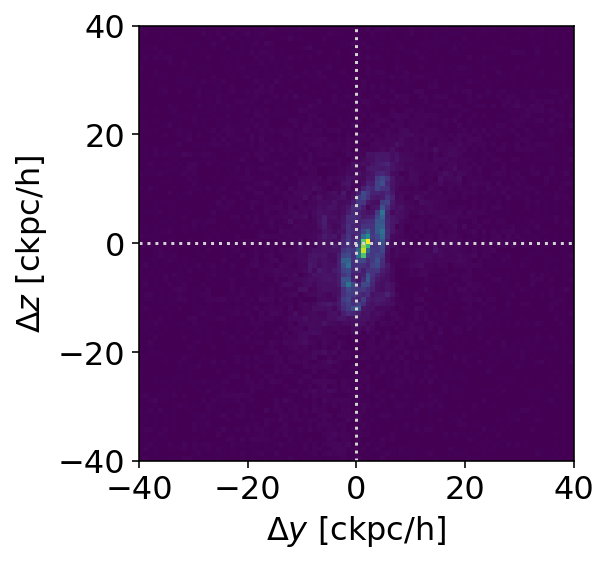

In [26]:
#ax = plotImg_subhalo(subhalo, idx=0, idy=1, ptlType='gas', D_x=40)
#ax = plotImg_subhalo(subhalo, idx=0, idy=2, ptlType='gas', D_x=40)
ax = plotImg_subhalo(subhalo, idx=1, idy=2, ptlType='gas', D_x=40)

#ax = plotImg_subhalo(subhalo, idx=0, idy=1, ptlType='stars', D_x=20)
#ax = plotImg_subhalo(subhalo, idx=0, idy=2, ptlType='stars', D_x=20)
#ax = plotImg_subhalo(subhalo, idx=1, idy=2, ptlType='stars', D_x=20)

## coordinate (minor) adjustment on subhalo

In [27]:
from utils import *

subhalo = pickle.load(open(filename_pkl, 'rb'))
R_spin = spin_rotation(spin0=subhalo.info['spin'], spinR=[0, 0, -1])
R_sini = sini_rotation(sini=1.0) # edge on on x-y plane
R_pa = PA_rotation(theta=0.)

Rtot = R_pa@R_sini@R_spin

#theta = 9. *np.pi/180.
#dx = [0.9,1.3,0]
#dv = [0.,0.,4.5]
dv = [0.,0.,0.]
theta = 0. *np.pi/180.
dx = [0.,0.,0]

subhalo.rotation(Rtot)

Rth = PA_rotation(theta=theta)
subhalo.rotation(Rth)

subhalo.recenter_pos(dx=dx)
subhalo.recenter_vel(dv=dv)

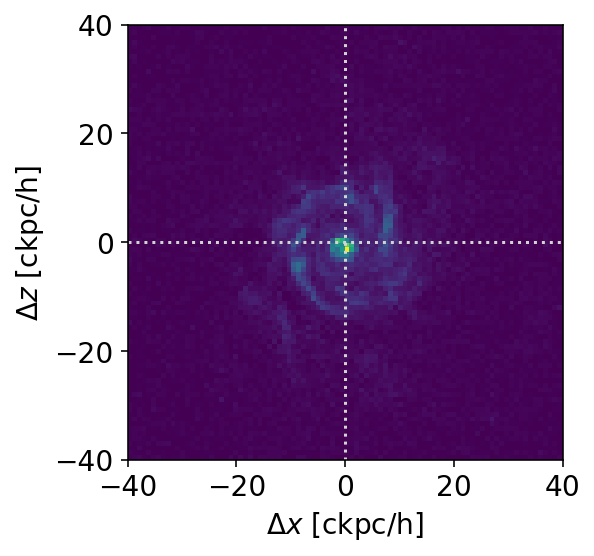

In [28]:
#ax = plotImg_subhalo(subhalo, idx=0, idy=1, ptlType='gas', D_x=40)
ax = plotImg_subhalo(subhalo, idx=0, idy=2, ptlType='gas', D_x=40)
#ax = plotImg_subhalo(subhalo, idx=1, idy=2, ptlType='gas', D_x=40)

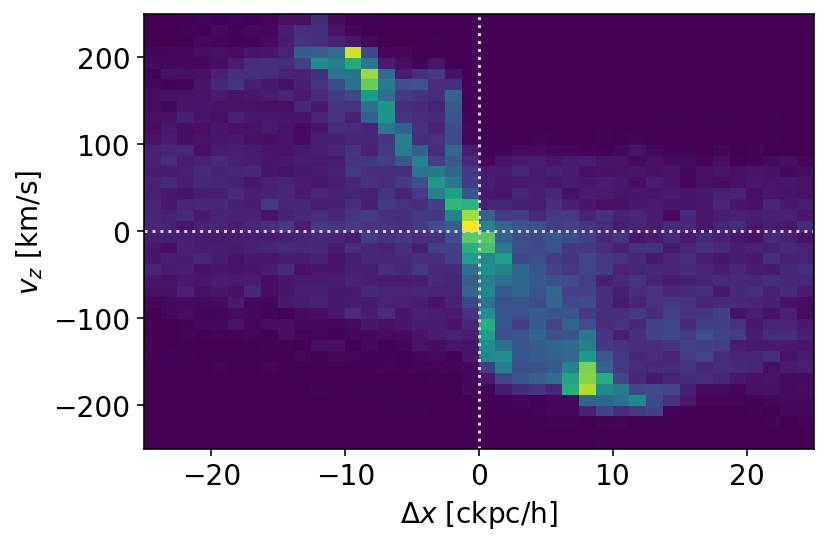

In [29]:
ax2 = plotXV_subhalo(subhalo, id_pos = 0, id_vel = 2, ptlType='gas')

### SFR

In [30]:
SFR = subhalo.snap['gas']['SFR']
newSFR = SFR[SFR > 0]

print('total gas cells:', len(SFR))
print('SFR>0 gas cells:', len(newSFR))

total gas cells: 58515
SFR>0 gas cells: 5865


In [31]:
import plotly.express as px

In [32]:
def gen_df(ptlType):
    
    data={
        'x': subhalo.snap[ptlType]['pos'][:,0],
        'y': subhalo.snap[ptlType]['pos'][:,1],
        'z': subhalo.snap[ptlType]['pos'][:,2],
        'mass': subhalo.snap[ptlType]['mass'],
    }
    
    if ptlType=='gas':
        data['SFR'] = subhalo.snap[ptlType]['SFR']
    
    df = pd.DataFrame(data)
    
    return df

In [33]:
df_gas = gen_df('gas')
df_stars = gen_df('stars')

In [34]:
fig = px.density_heatmap(df_gas, x="x", y="z", z='SFR', 
                         nbinsx=400, nbinsy=400,
                         color_continuous_scale="Viridis",
                         title='gas SFR density map')

# fig = px.density_heatmap(df_gas, x="x", y="z", z='mass', 
#                          nbinsx=300, nbinsy=300,
#                          color_continuous_scale="Viridis",
#                          title='gas mass density map')

# fig = px.density_heatmap(pd.concat([df_gas, df_stars], sort=False), x="x", y="z", z='mass', 
#                         nbinsx=200, nbinsy=200, color_continuous_scale="Viridis")

fig.update_layout(
    xaxis = dict(range=[-30, 30]),
    yaxis = dict(range=[-30, 30], scaleanchor='x'),
    width=500,
    height=445,
    margin=dict(l=0, r=0, b=30, t=90),
    #paper_bgcolor="LightSteelBlue",
)

fig['layout']['font']['size']=16

fig.show()

# ------ make mocks with TNGmock ------

In [35]:
dir_repo = dir_current+'/../..'
dir_BinnedFit = dir_repo+"/BinnedFit"
dir_KLens = dir_repo+"/KLens"

sys.path.append(dir_KLens)
from KLtool import *

sys.path.append(dir_TNGcube)
from TNGcube import *

sys.path.append(dir_BinnedFit)
from binnedFit_utilities import lambda_to_velocity, velocity_to_lambda

In [36]:
filename_pkl = f'subhalo_{subhaloID}.pkl'
subhalo = pickle.load(open(filename_pkl, 'rb'))

In [37]:
pars = {}
pars['spinR'] = [0, 0, -1]
pars['sini'] = 1.00
pars['theta_int'] = 0.       # np.pi/6.
pars['g1'] = 0.0
pars['g2'] = 0.0
pars['redshift'] = 0.3
pars['psfFWHM'] = 0.5
pars['sigma_thermal'] = 16.  # [unit: km/s]

pars['slitAngles'] = [0., np.pi/2]

lambda_cen0 = ParametersTNG.lineLambda0['Halpha']
#lambda_cen0 = (lineLambda0['OIIa']+lineLambda0['OIIb'])/2.

pars['lambda_cen'] = (1+pars['redshift'])*lambda_cen0

In [38]:
pars['expTime'] = 30.*60.              # [unit: sec]
pars['area'] = 3.14 * (1000./2.)**2    # telescope area [unit: cm2]

pars['ref_SDSS_lineL'] = 3.*1e-17      # [unit: erg/s/Angstrom/cm2]    # * u.erg/u.second/u.Angstrom/u.cm**2

fiber_SDSS = np.pi * 1.5**2.           # fiber size [unit: arcsec2]
refSDSSspec = pars['ref_SDSS_lineL'] * u.erg/u.second/u.Angstrom/u.cm**2
refSDSSspec = refSDSSspec.to(u.erg/u.second/u.nm/u.cm**2)
print('reference SDSS fiber spec:', refSDSSspec)

pars['lineflux'] = refSDSSspec.value / fiber_SDSS  # [unit: erg/s/cm2/nm/arcsec2]
pars['lineflux']

pars['ngrid'] = 256

reference SDSS fiber spec: 2.9999999999999994e-16 erg / (cm2 nm s)


In [39]:
par_meta = {}
# optimal par_meta for subhaloID=46, snap=75
#par_meta['theta'] = 15. *np.pi/180.
#par_meta['dx'] = [0.8,1.3,0]
#par_meta['dv'] = [0.0,0.,4.5]

par_meta['theta'] = 0.*np.pi/180.
par_meta['dx'] = [0.0, 0.0, 0.0]
par_meta['dv'] = [0.0, 0.0, 0.0]

In [40]:
mock = TNGmock(pars=pars, subhalo=subhalo, par_meta=par_meta, auto_tune=True)

residual PA = 21.653 deg. (auto-corrected)
residual center offset: (-0.016, -0.567) [arcsec] (auto-corrected)
residual center offset: (-0.064, -2.293) [ckpc] (auto-corrected)


In [41]:
imgArr = mock.gen_imageArray(weights='line')
img0 = Image(imgArr, mock.Pars.spaceGrid)
img0.add_psf(psfFWHM=mock.Pars.psfFWHM, psf_g1=mock.Pars.psf_g1, psf_g2=mock.Pars.psf_g2)
gsImg = img0.gen_galsimImage()

(<Figure size 324x288 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fcc607aee90>)

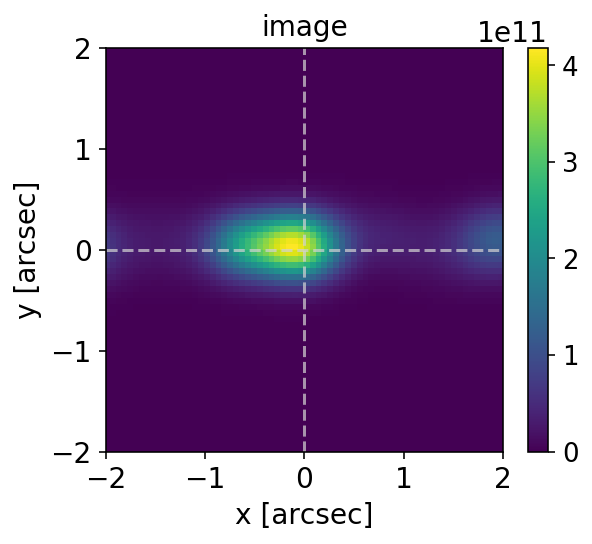

In [42]:
img0.display(xlim=[-2,2])

In [43]:
mock.moments = gsImg.FindAdaptiveMom()
mock.moments

galsim.hsm.ShapeData(image_bounds=galsim.BoundsI(xmin=0, xmax=255, ymin=0, ymax=255), moments_status=0, observed_shape=galsim.Shear((0.32991743640424204-0.0004408544968908363j)), moments_sigma=5.24777364730835, moments_amp=70335890194432.0, moments_centroid=galsim.PositionD(x=123.98865817838904, y=128.25118700475247), moments_rho4=2.0840055018211703, moments_n_iter=23, correction_status=-10)

## generate a noiseless image to check the optimal major and minor axes of slitAngles

(<Figure size 324x288 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fcc518d1f90>)

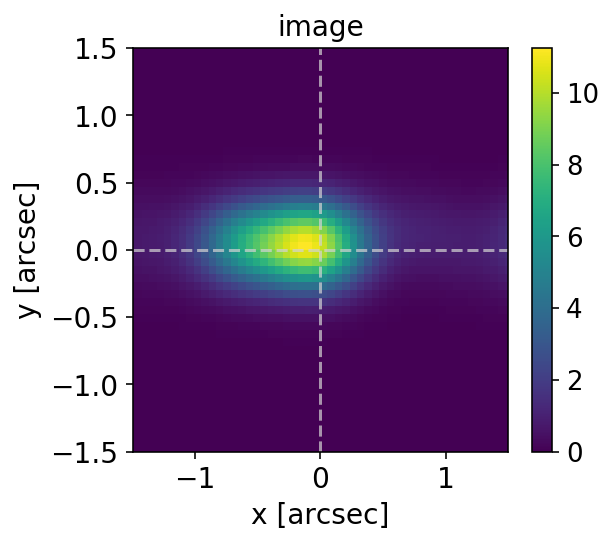

In [44]:
#image0 = mock.gen_mock_image(weights='photometry', band='r', noise_mode=0)
image0 = mock.gen_mock_image(weights='line', noise_mode=0)
#image0 = mock.gen_mock_image(weights='mass', noise_mode=0)
image0.display(xlim=[-1.5,1.5])

In [45]:
gsImg0 = image0.gen_galsimImage()
moments0 = gsImg0.FindAdaptiveMom()
print('moments:')
print(moments0)
print('shapes:')
print(moments0.observed_shape)

moments:
galsim.hsm.ShapeData(image_bounds=galsim.BoundsI(xmin=0, xmax=255, ymin=0, ymax=255), moments_status=0, observed_shape=galsim.Shear((0.32991743640443166-0.00044085507778092507j)), moments_sigma=5.24777364730835, moments_amp=1894.467041015625, moments_centroid=galsim.PositionD(x=123.98865816051136, y=128.251187011244), moments_rho4=2.0840055030298115, moments_n_iter=23, correction_status=-10)
shapes:
galsim.Shear(g1=0.32991743640443166,g2=-0.00044085507778092507)


In [46]:
slitAng_major_p = moments0.observed_shape.beta.rad 
slitAng_minor_p = slitAng_major_p + np.pi/2.

print(f"slitAng_major : {moments0.observed_shape.beta.deg:.3f}")
print(f"slitAng_minor : {moments0.observed_shape.beta.deg+90:.3f}")

mock.Pars.fid['slitAngles'] = np.array([slitAng_major_p, slitAng_minor_p])

slitAng_major : -0.038
slitAng_minor : 89.962


### default auto mock generation

In [47]:
dataInfo = mock.gen_mock_data(noise_mode=0)

(<Figure size 324x288 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fcc307b5310>)

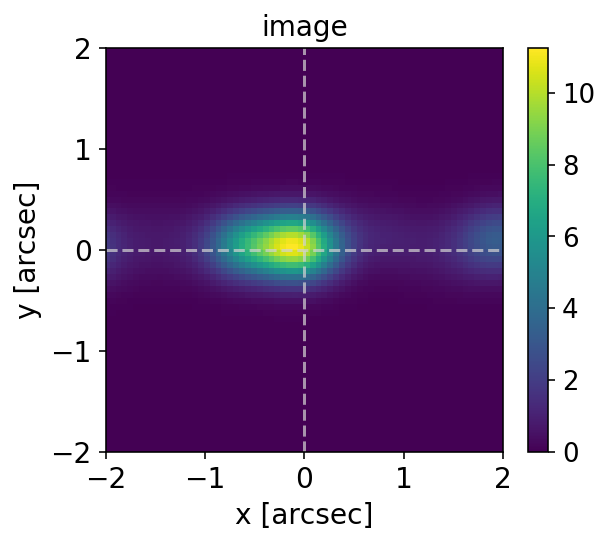

In [48]:
dataInfo['image'].display(xlim=[-2., 2.])

RuntimeError for pos_id: 202. Set best-fit gaussian amp. = 0
time cost in gaussFit_spec2D: 0.23642897605895996 (secs)


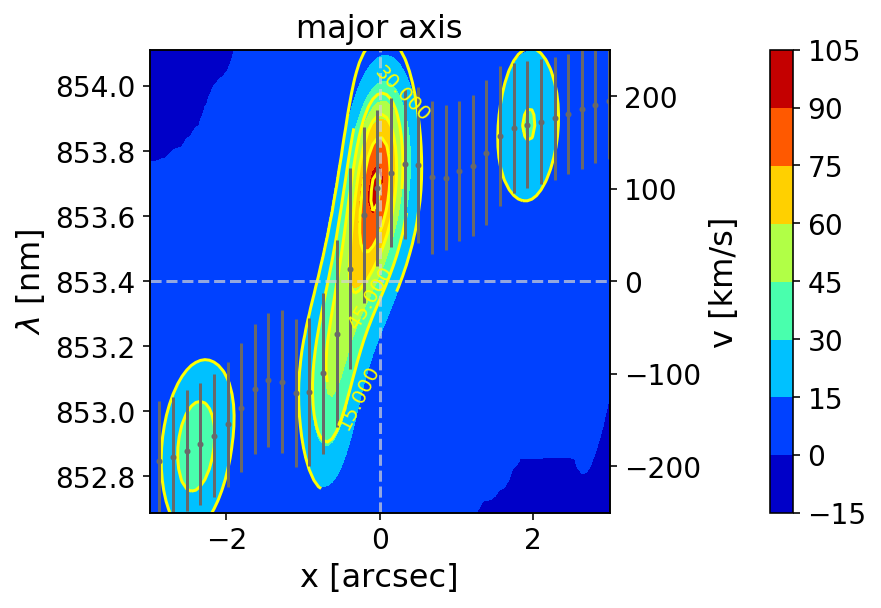

In [49]:
model_major = dataInfo['spec'][0].GF.model
fig, ax = dataInfo['spec'][0].display(xlim=[-3, 3], vlim=[-250, 250], mark_fit=True, model=model_major, title='major axis')

time cost in gaussFit_spec2D: 0.29940295219421387 (secs)


(<Figure size 468x324 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fcc256f8c90>)

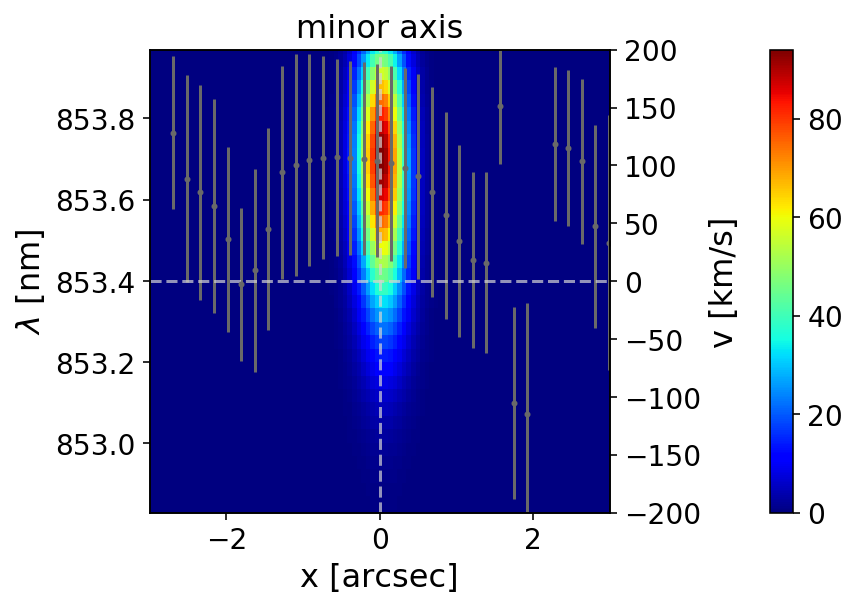

In [50]:
model_minor = dataInfo['spec'][1].GF.model #, model=model_minor
dataInfo['spec'][1].display(xlim=[-3., 3], vlim=[-200, 200], mark_fit=True, title='minor axis')

(<Figure size 468x324 with 3 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fcc51c43ed0>)

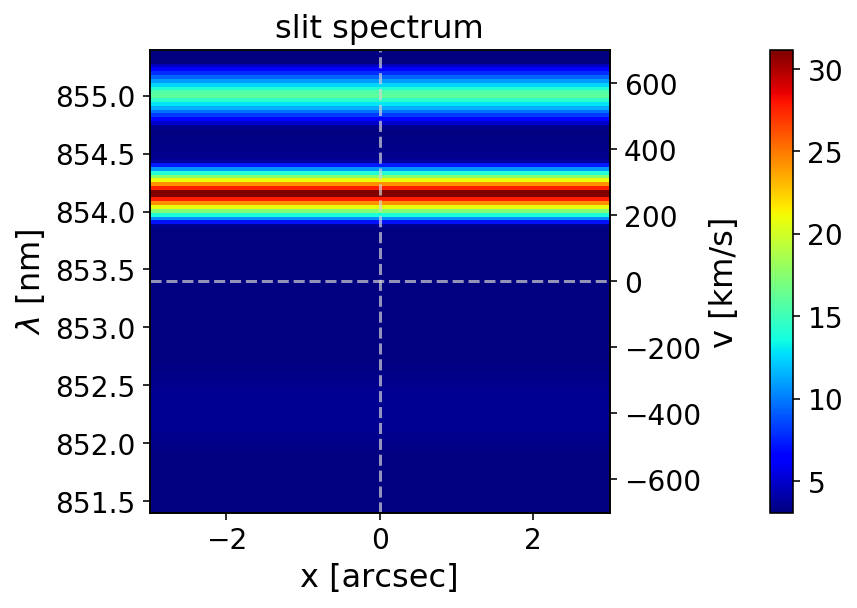

In [51]:
spec2D_sky = Spec2D(array=mock.sky.spec2D_arr, array_var=mock.sky.spec2D_arr, 
                    spaceGrid=mock.specCube.spaceGrid, lambdaGrid=mock.specCube.lambdaGrid, 
                    line_species=dataInfo['line_species'], z=mock.z, auto_cut=False)
spec2D_sky.display(xlim=[-3.,3.])